# Selected eddy overviews

For each supplied eddy, show compact tilt/PV time series beside its trajectory over bathymetry. Regime colours: green planetary, orange topographic and grey mixed. Blue arrows are surface-to-deep tilt; magenta arrows are the fixed-core mean environmental PV-gradient direction.

In [1]:
from pathlib import Path
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

HERE=Path.cwd().resolve()
ANALYSIS_ROOT=next((p for p in (HERE,*HERE.parents) if (p/"seacofs_tilt_tools.py").exists()),None)
if ANALYSIS_ROOT is None:
    raise FileNotFoundError("Run inside seacofs_eddy_tilt_analysis or a subfolder")
CASE_ROOT=ANALYSIS_ROOT/"case_studies"
for path in (ANALYSIS_ROOT,CASE_ROOT,HERE):
    if str(path) not in sys.path: sys.path.insert(0,str(path))
import seacofs_tilt_tools as tilt
import selected_case_tools as cases
sns.set_theme(style="whitegrid",context="notebook")


In [2]:
paths=tilt.Paths(); grid=tilt.load_grid(paths.grid,paths.z_r)
data=cases.load_cache()
available={(cyc,int(eddy)) for cyc,eddy in data[["Cyc","Eddy"]].drop_duplicates().itertuples(index=False,name=None)}
requested={(cyc,eddy) for cyc,ids in cases.SELECTED_EDDIES.items() for eddy in ids}
missing=sorted(requested-available)
if missing: print("Missing selected tracks:",missing)

In [3]:
data.columns

Index(['Eddy', 'Day', 'Cyc', 'lon', 'lat', 'ic', 'jc', 'xc', 'yc', 'w',
       'Omega', 'q11', 'q12', 'q22', 'Rc', 'psi0', 'AR', 'R', 'Age', 'Date',
       'fname', 'TiltDis', 'TiltDir', 'Region', 'w_surface',
       'w_selected_depth_m', 'w_profile_n', 'h', 'f', 'beta', 'dhdx', 'dhdy',
       'zeta_mean', 'abs_vort', 'PV', 'PV_footprint_n',
       'PV_weight_effective_n', 'PV_grad_plan_x', 'PV_grad_plan_y',
       'PV_grad_plan_mean_local_mag', 'PV_grad_plan_rms_local_mag',
       'PV_grad_plan_p90_local_mag', 'PV_grad_plan_coherence',
       'PV_grad_topo_x', 'PV_grad_topo_y', 'PV_grad_topo_mean_local_mag',
       'PV_grad_topo_rms_local_mag', 'PV_grad_topo_p90_local_mag',
       'PV_grad_topo_coherence', 'PV_grad_x', 'PV_grad_y',
       'PV_grad_mean_local_mag', 'PV_grad_rms_local_mag',
       'PV_grad_p90_local_mag', 'PV_grad_coherence', 'PV_grad_eddy_x',
       'PV_grad_eddy_y', 'PV_grad_eddy_mean_local_mag',
       'PV_grad_eddy_rms_local_mag', 'PV_grad_eddy_p90_local_mag',
     

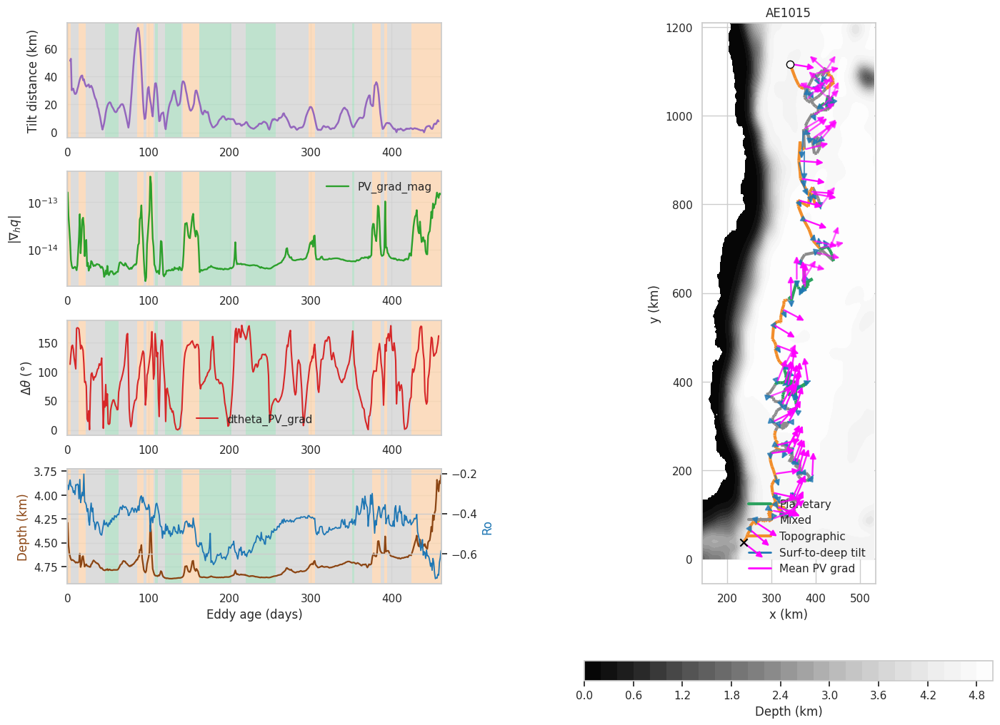

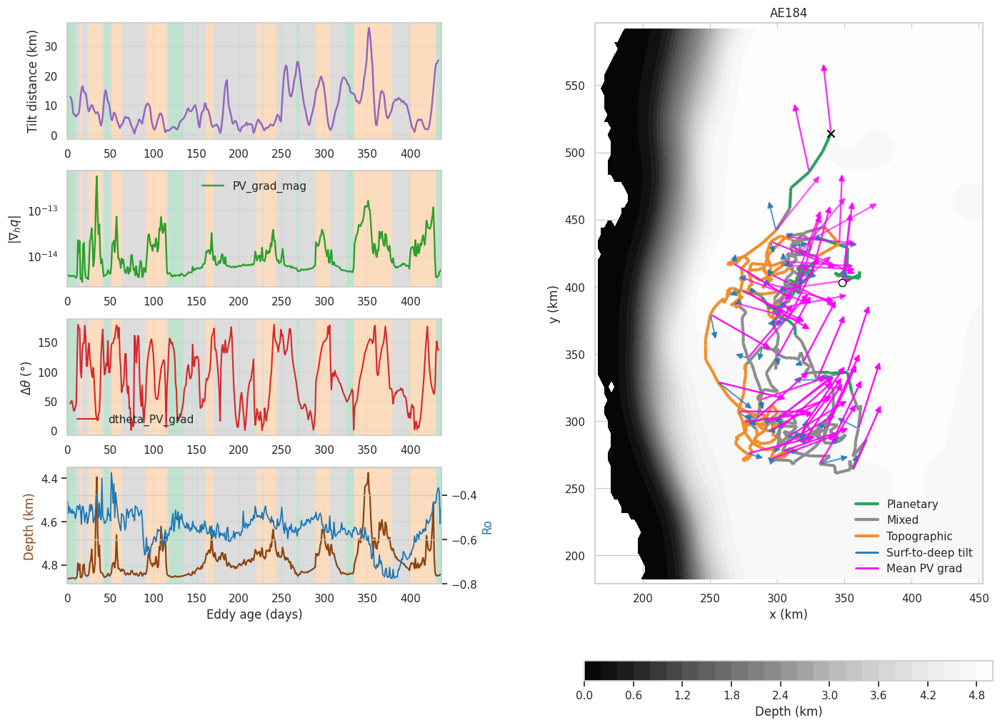

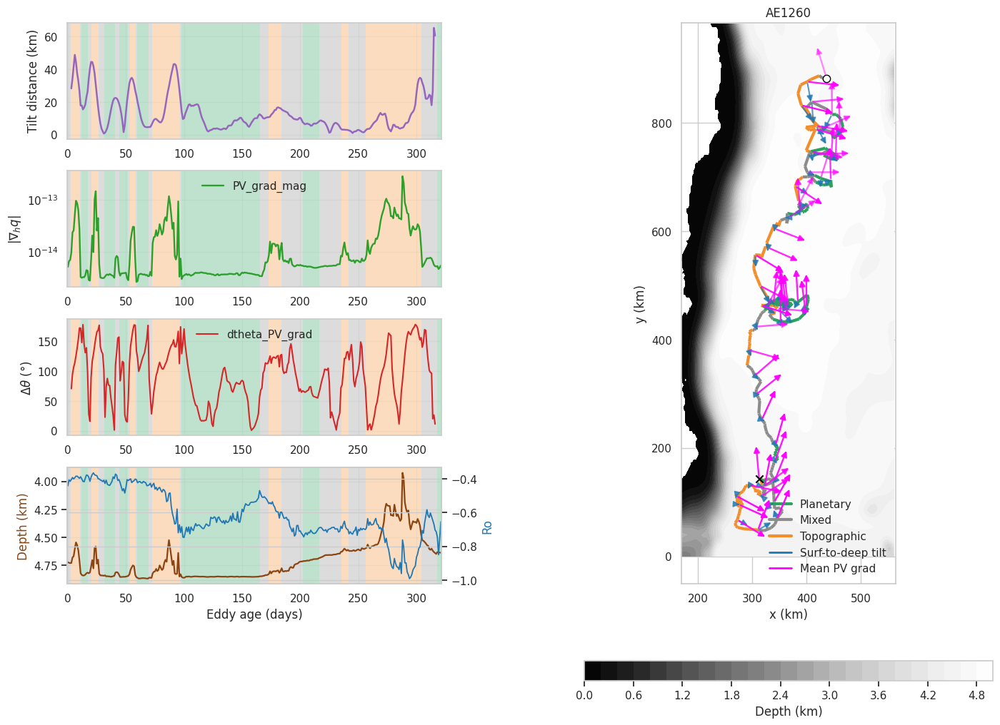

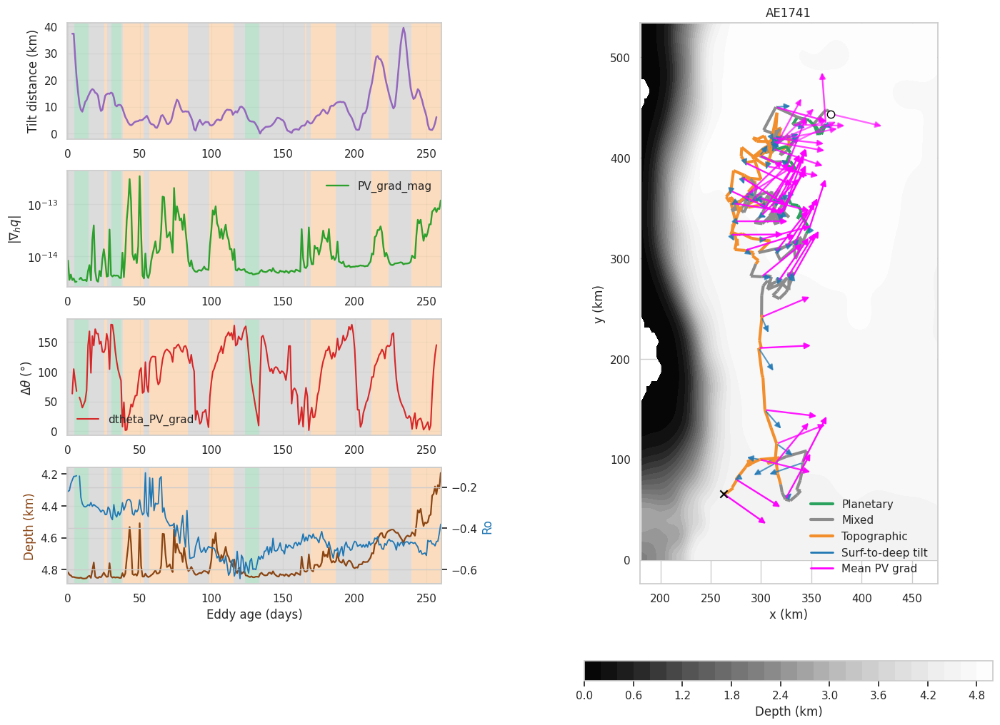

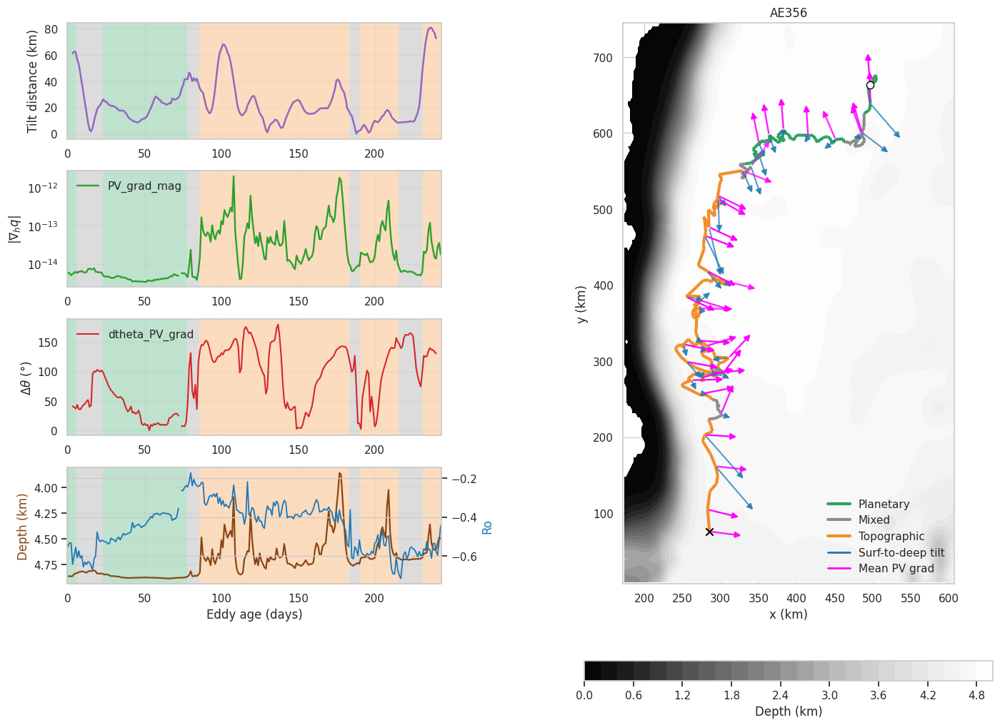

...

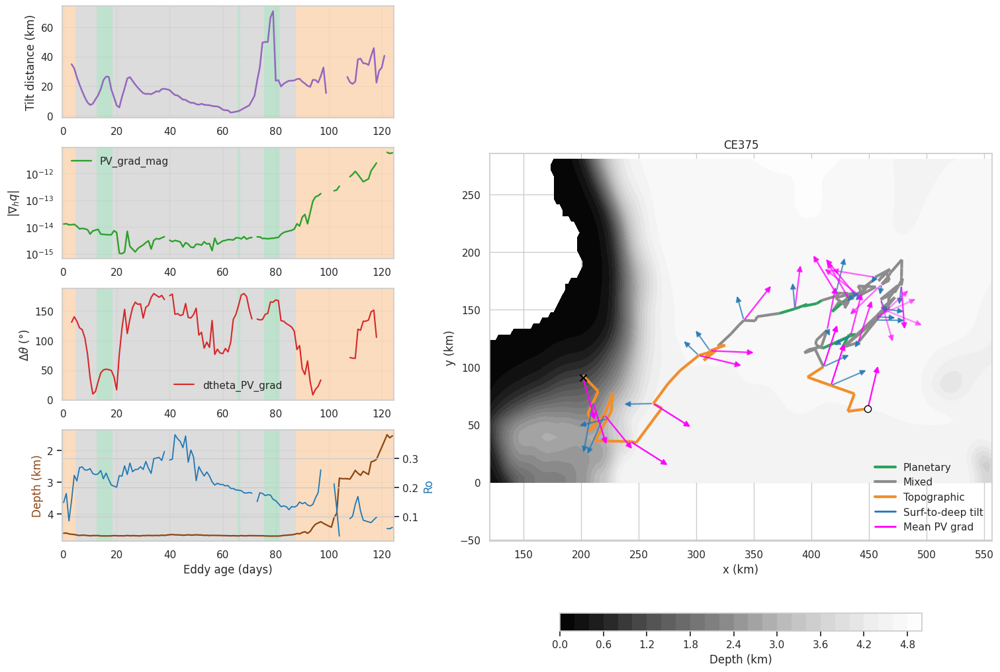

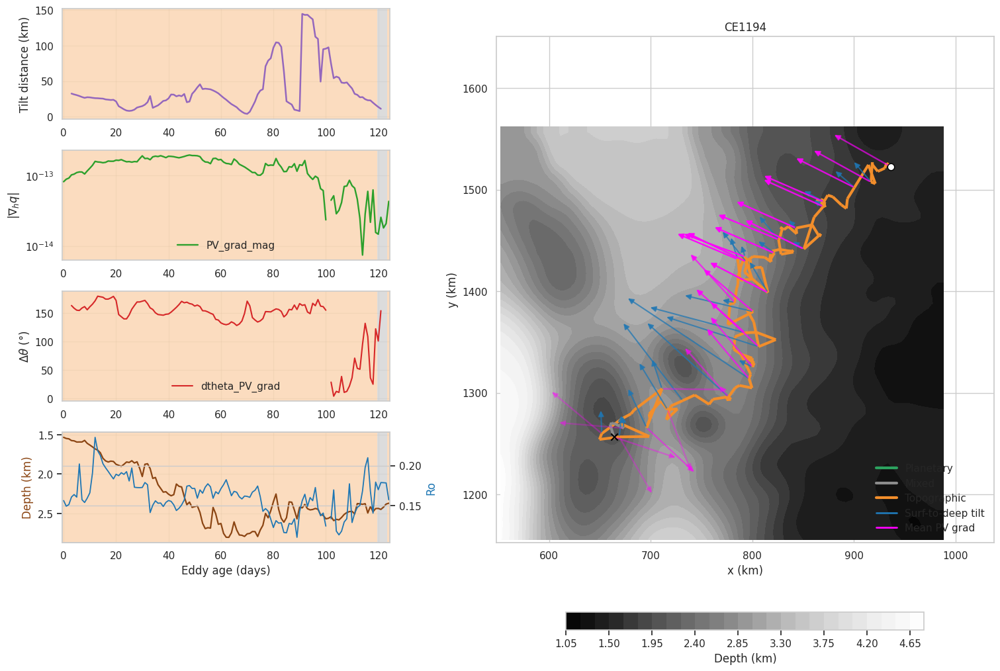

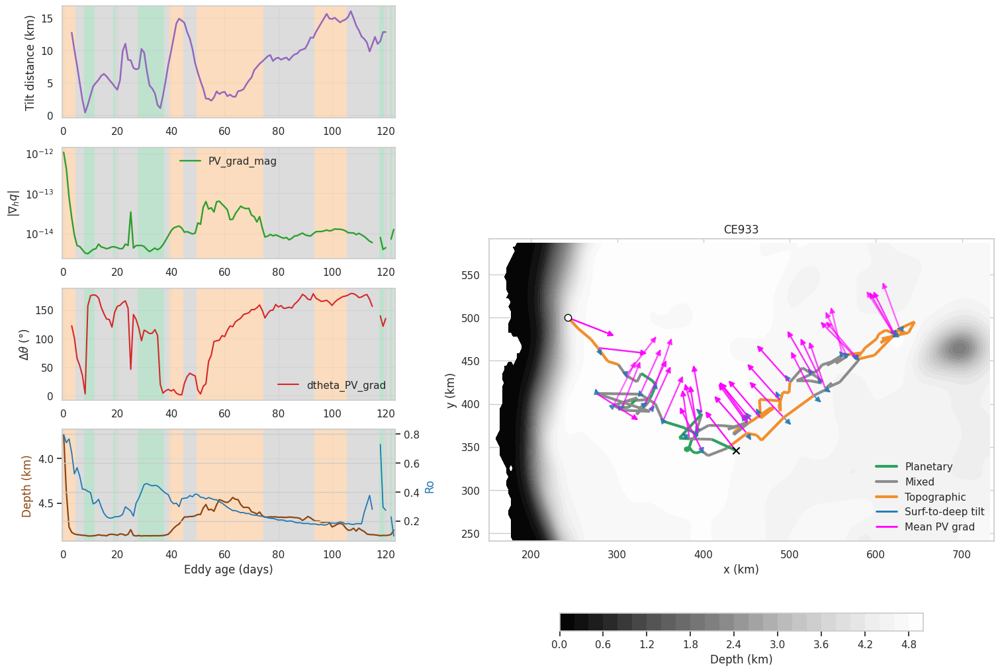

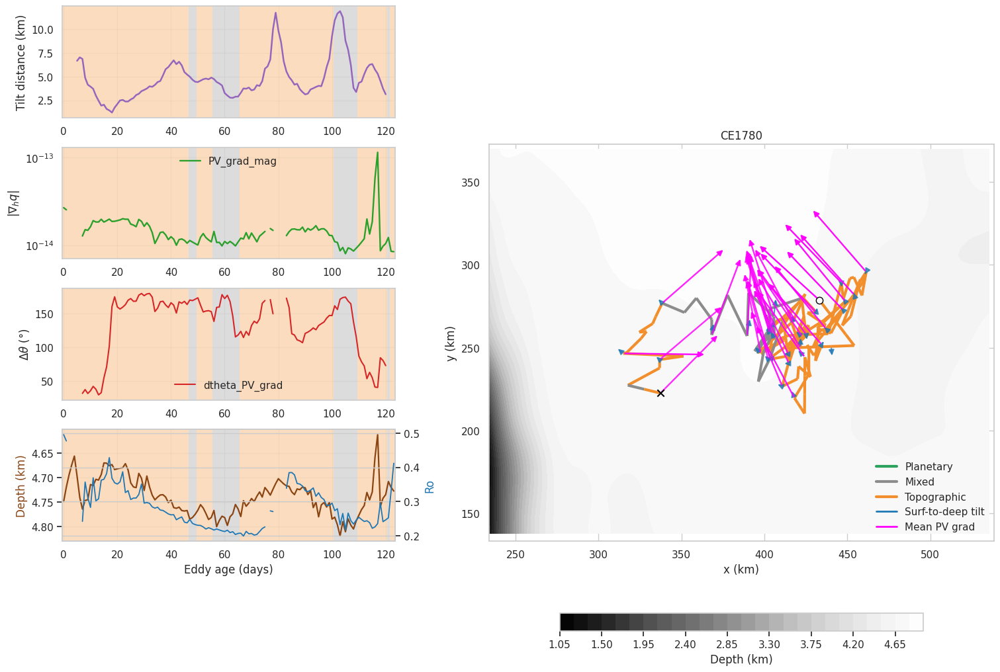

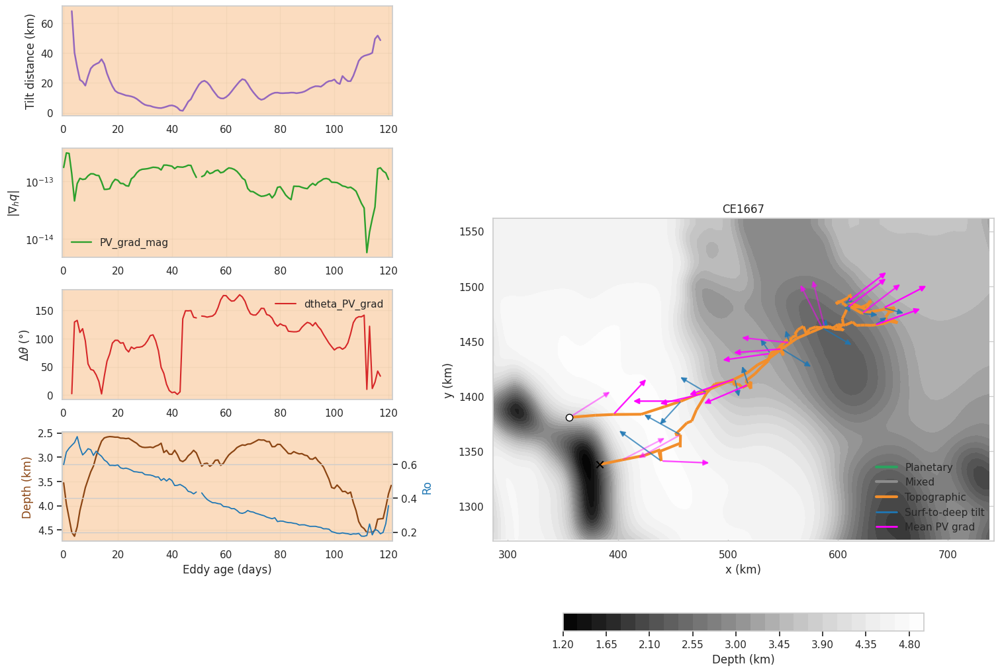

In [4]:
for cyc,eddy_ids in cases.SELECTED_EDDIES.items():
    for eddy in eddy_ids:
        track=data[data.Cyc.eq(cyc)&data.Eddy.eq(eddy)]
        if not track.empty:
            cases.plot_eddy_overview(track,grid,dist_arrow=50)
            plt.show()

PV-gradient arrows are normalised to show direction; their magnitude is shown in the time series. Arrow opacity increases with vector coherence, so cancellation-dominated directions are visually de-emphasised.